<a href="https://colab.research.google.com/github/macedorafa1024/Cap1_Fase6/blob/main/RafaelGomesDeMacedo_RM566955_pbl_fase6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
import torch
print(torch.cuda.is_available())

True


Foi utilizada aceleração por GPU para otimizar o tempo de treinamento, garantindo melhor eficiência computacional.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Projeto de Visão Computacional com YOLO

Este projeto tem como objetivo desenvolver um modelo de detecção de objetos utilizando a arquitetura YOLO (You Only Look Once).

Foram utilizadas duas classes:
- Garrafa
- Mouse

O dataset foi organizado em conjuntos de treino, validação e teste, seguindo as boas práticas de Machine Learning.

O modelo será treinado e avaliado para analisar sua acurácia e desempenho.

In [2]:
!git clone https://github.com/ultralytics/yolov5
%cd /content/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5


In [3]:
!pip install -r requirements.txt

In [18]:
import os

base = "/content/drive/MyDrive/FIAP/Fase6/dataset"

print("Train images:", len(os.listdir(f"{base}/images/train")))
print("Val images:", len(os.listdir(f"{base}/images/val")))
print("Test images:", len(os.listdir(f"{base}/images/test")))
print("Train labels:", len(os.listdir(f"{base}/labels/train")))
print("Val labels:", len(os.listdir(f"{base}/labels/val")))

Train images: 64
Val images: 8
Test images: 8
Train labels: 64
Val labels: 8


## Treinamento do modelo (30 épocas)

Nesta etapa, realizamos o treinamento inicial do modelo utilizando a arquitetura YOLOv5 com pesos pré-treinados (transfer learning).

O objetivo deste treinamento é avaliar o comportamento inicial do modelo com uma quantidade moderada de épocas.

Parâmetros utilizados:
- Tamanho da imagem: 640x640
- Batch size: 16
- Número de épocas: 30
- Dataset customizado (garrafa e mouse)

Este treinamento servirá como base para comparação com um modelo mais treinado (60 épocas).

In [19]:
!python train.py \
--img 640 \
--batch 16 \
--epochs 30 \
--data /content/drive/MyDrive/FIAP/Fase6/dataset/data.yaml \
--weights yolov5s.pt \
--project /content/drive/MyDrive/FIAP/Fase6/runs \
--name treino_30

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: WARNING W&B disabled due to login timeout.
wandb: ERROR Error while calling W&B API: api key too short (<Response [401]>)
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/FIAP/Fase6/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=/content/drive/MyDrive/F

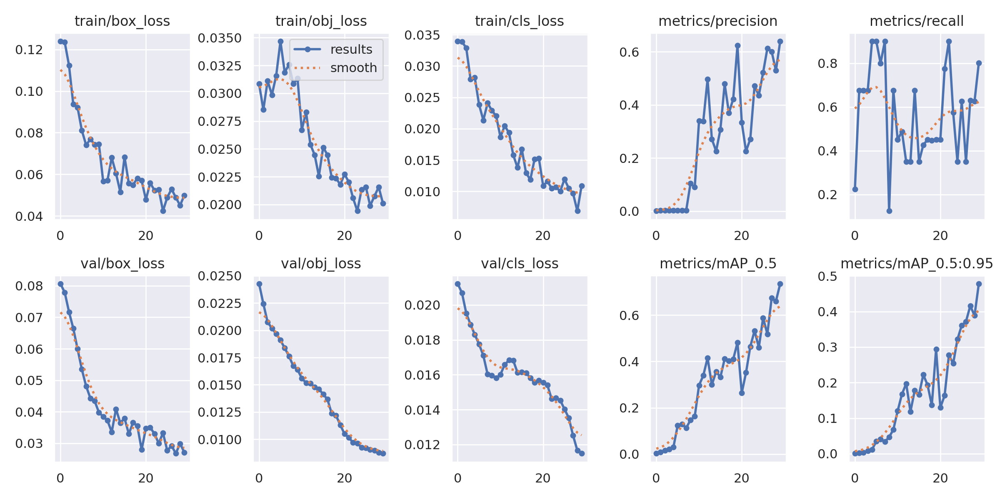

In [20]:
from IPython.display import Image, display

display(Image(filename='/content/drive/MyDrive/FIAP/Fase6/runs/treino_30/results.png'))

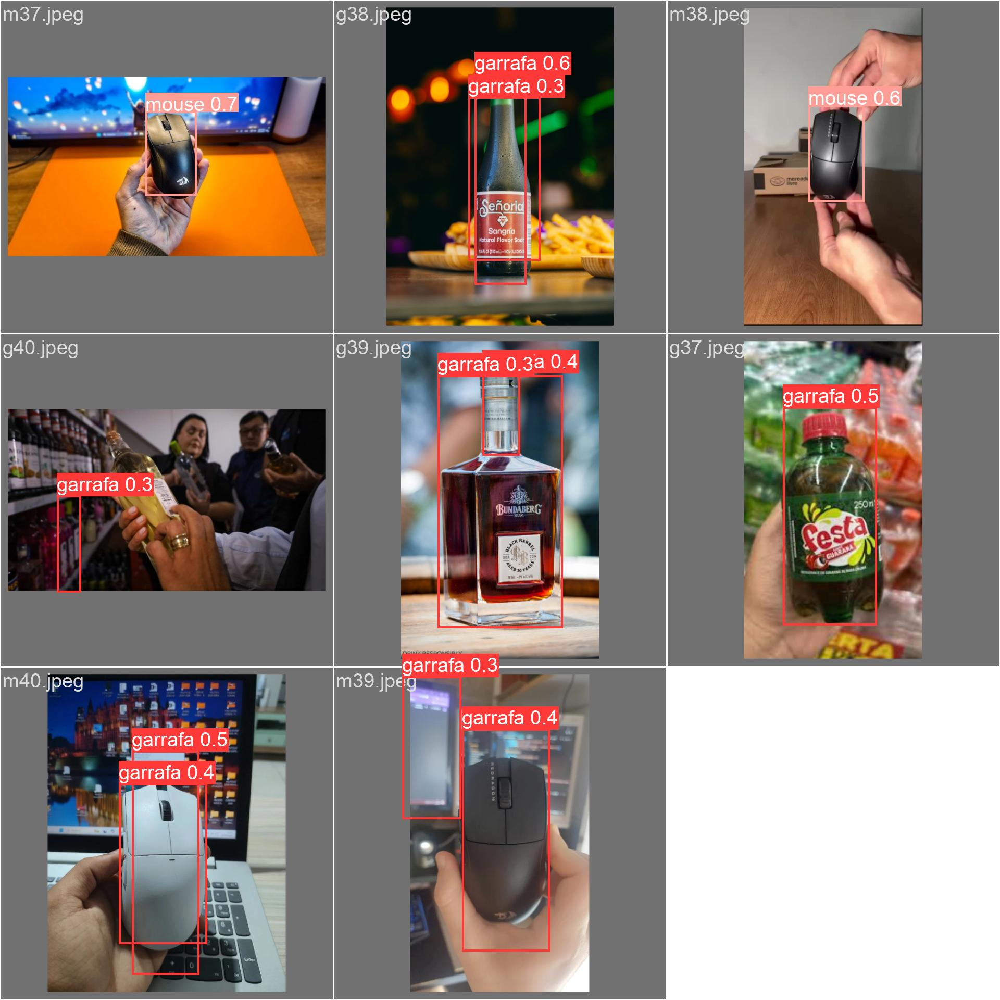

In [21]:
display(Image(filename='/content/drive/MyDrive/FIAP/Fase6/runs/treino_30/val_batch0_pred.jpg'))

## Análise dos resultados (30 épocas)

Após o treinamento do modelo por 30 épocas, foi possível observar uma evolução consistente no processo de aprendizado.

As métricas de perda (loss) apresentaram comportamento esperado:
- O train/box_loss, train/obj_loss e train/cls_loss diminuíram progressivamente, indicando que o modelo aprendeu a localizar e classificar os objetos com maior precisão ao longo do tempo.
- As métricas de validação (val/box_loss, val/obj_loss e val/cls_loss) acompanharam essa redução, o que sugere boa capacidade de generalização, sem sinais evidentes de overfitting.

Em relação às métricas de desempenho:
- A precisão (precision) apresentou crescimento ao longo das épocas, atingindo valores próximos de 0.65 a 0.70, embora com algumas oscilações, indicando ainda certa instabilidade nas predições.
- O recall apresentou variação mais acentuada, oscilando entre aproximadamente 0.3 e 0.9, o que sugere inconsistência na detecção de todos os objetos presentes nas imagens.
- O mAP@0.5 evoluiu até cerca de 0.70, indicando um desempenho razoável na detecção considerando um limiar de interseção mais permissivo.
- Já o mAP@0.5:0.95 atingiu aproximadamente 0.45, mostrando que o modelo ainda apresenta limitações quando avaliado em critérios mais rigorosos.

De forma geral, o modelo demonstrou aprendizado efetivo, porém com instabilidade nas métricas de precisão e recall. Isso indica que, embora o modelo já seja capaz de identificar os objetos, ainda há necessidade de mais treinamento para melhorar a consistência e robustez das previsões.

## Treinamento do modelo (60 épocas)

Nesta etapa, aumentamos o número de épocas para 60, com o objetivo de melhorar o desempenho do modelo.

A ideia é permitir que a rede neural tenha mais tempo para aprender padrões e melhorar a precisão das detecções.

Os parâmetros permanecem os mesmos, alterando apenas o número de épocas.

Este experimento será comparado com o treinamento anterior para avaliar ganhos de desempenho.

In [22]:
!python train.py \
--img 640 \
--batch 16 \
--epochs 60 \
--data /content/drive/MyDrive/FIAP/Fase6/dataset/data.yaml \
--weights yolov5s.pt \
--project /content/drive/MyDrive/FIAP/Fase6/runs \
--name treino_60

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: WARNING W&B disabled due to login timeout.
wandb: ERROR Error while calling W&B API: api key too short (<Response [401]>)
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/FIAP/Fase6/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=60, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=/content/drive/MyDrive/F

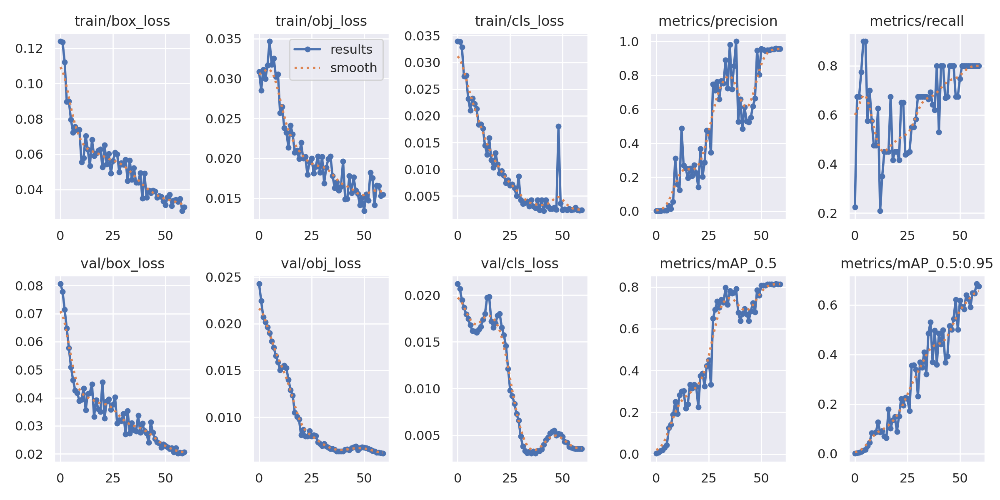

In [23]:
from IPython.display import Image, display

display(Image(filename='/content/drive/MyDrive/FIAP/Fase6/runs/treino_60/results.png'))

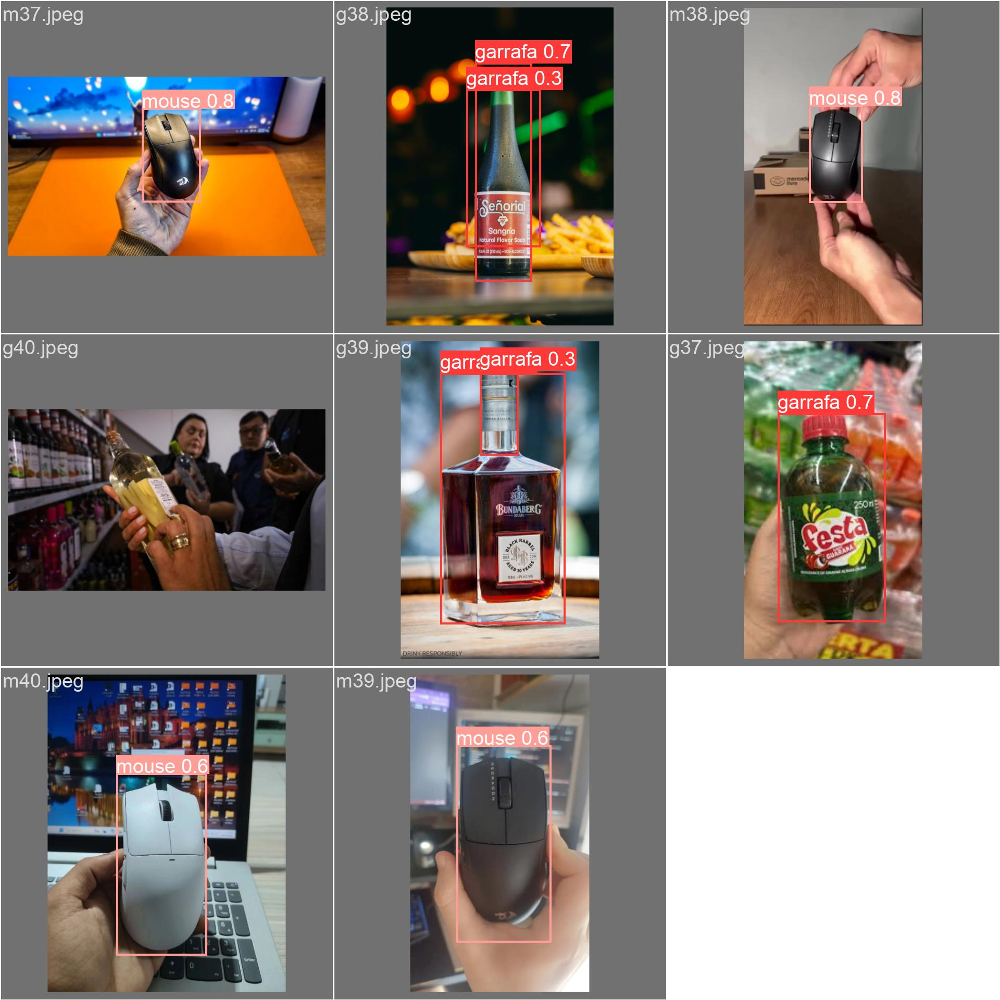

In [24]:
display(Image(filename='/content/drive/MyDrive/FIAP/Fase6/runs/treino_60/val_batch0_pred.jpg'))

## Análise dos resultados (60 épocas)

Com o aumento do número de épocas para 60, foi possível observar uma evolução mais sólida e estável no desempenho do modelo.

As métricas de perda apresentaram redução mais acentuada:
- O train/box_loss, train/obj_loss e train/cls_loss continuaram diminuindo, indicando refinamento do aprendizado.
- As métricas de validação também apresentaram queda consistente, demonstrando que o modelo não sofreu overfitting significativo mesmo com mais épocas.

Em relação às métricas de desempenho:
- A precisão atingiu valores próximos de 0.90 a 1.00, indicando forte redução de falsos positivos.
- O recall tornou-se mais estável, mantendo valores próximos de 0.75 a 0.80.
- O mAP@0.5 atingiu aproximadamente 0.80, demonstrando melhora na detecção geral.
- O mAP@0.5:0.95 chegou próximo de 0.65, indicando evolução significativa em cenários mais rigorosos.

Além disso, foi possível observar maior estabilidade nas curvas, com menos oscilações em comparação ao modelo de 30 épocas.

## Comparação entre os modelos (30 vs 60 épocas)

A comparação entre os dois treinamentos evidencia o impacto positivo do aumento do número de épocas.

Principais diferenças observadas:
- O modelo com 60 épocas apresentou métricas superiores em todas as categorias (precision, recall e mAP).
- Houve redução significativa das oscilações, indicando maior estabilidade no processo de aprendizado.
- O mAP@0.5 evoluiu de aproximadamente 0.70 para 0.80.
- O mAP@0.5:0.95 apresentou ganho relevante, passando de cerca de 0.45 para 0.65.

Enquanto o modelo de 30 épocas ainda demonstrava inconsistência nas previsões, o modelo de 60 épocas mostrou-se mais robusto e confiável.

Isso indica que o modelo se beneficiou do maior tempo de treinamento, conseguindo aprender melhor as características dos objetos presentes no dataset.

## Testes do modelo (Inferência)

Nesta etapa, o modelo treinado foi utilizado para realizar a detecção de objetos em imagens de teste.

As imagens processadas demonstram a capacidade do modelo em identificar corretamente os objetos das classes definidas (garrafa e mouse), destacando-os com bounding boxes e suas respectivas probabilidades.

Observa-se que o modelo conseguiu detectar múltiplos objetos em uma mesma imagem, ainda que com diferentes níveis de confiança, o que evidencia seu funcionamento em cenários mais complexos.

In [25]:
!python detect.py \
--weights /content/drive/MyDrive/FIAP/Fase6/runs/treino_60/weights/best.pt \
--img 640 \
--conf 0.25 \
--source /content/drive/MyDrive/FIAP/Fase6/dataset/images/test

detect: weights=['/content/drive/MyDrive/FIAP/Fase6/runs/treino_60/weights/best.pt'], source=/content/drive/MyDrive/FIAP/Fase6/dataset/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-481-g00c14a25 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/8 /content/drive/MyDrive/FIAP/Fase6/dataset/images/test/g33.jpeg: 640x640 2 garrafas, 11.4ms
image 2/8 /content/drive/MyDrive/FIAP/Fase6/dataset/images/test/g34.jpeg: 384x640 8 garrafas, 32.7ms
image 3/8 /content/drive/MyDrive/FIAP/Fase6

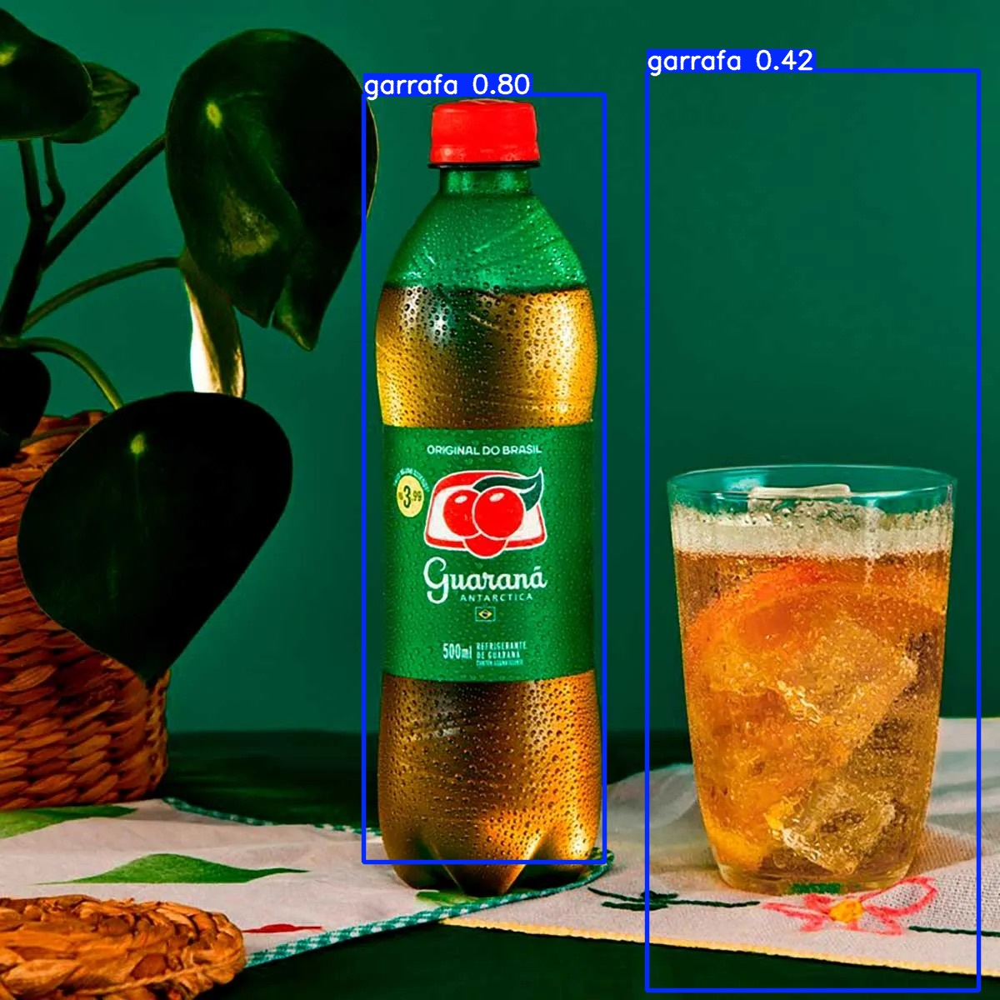

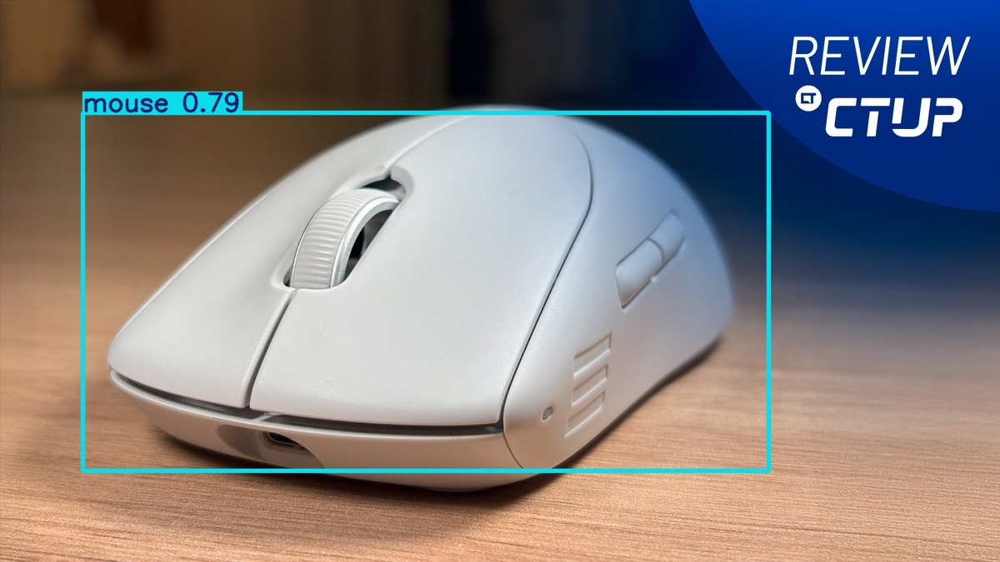

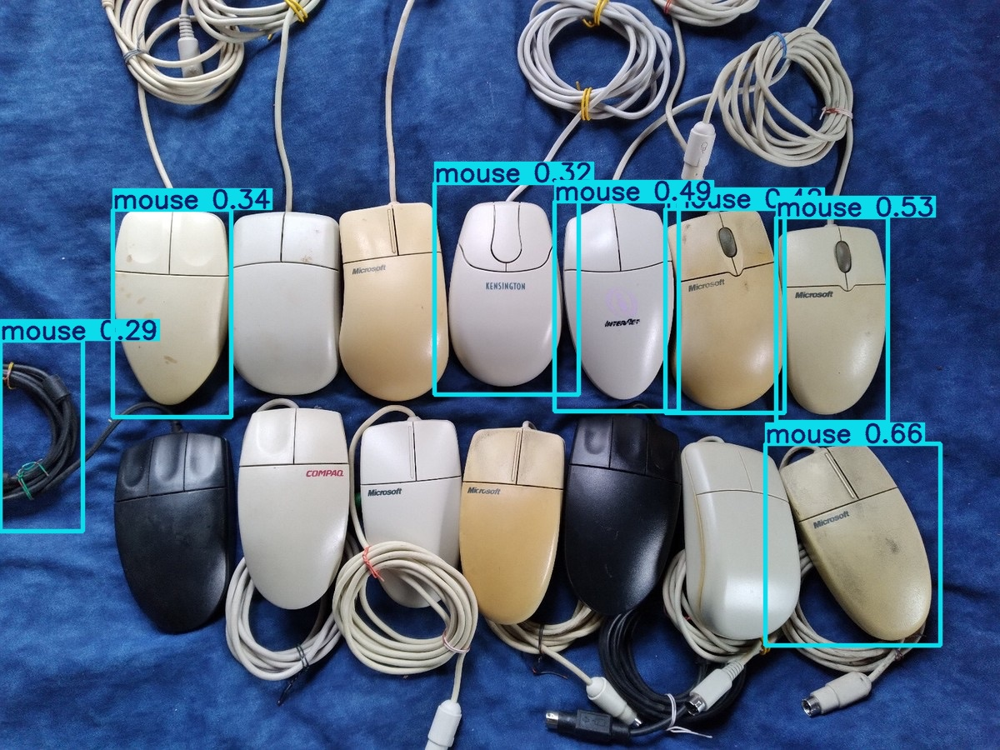

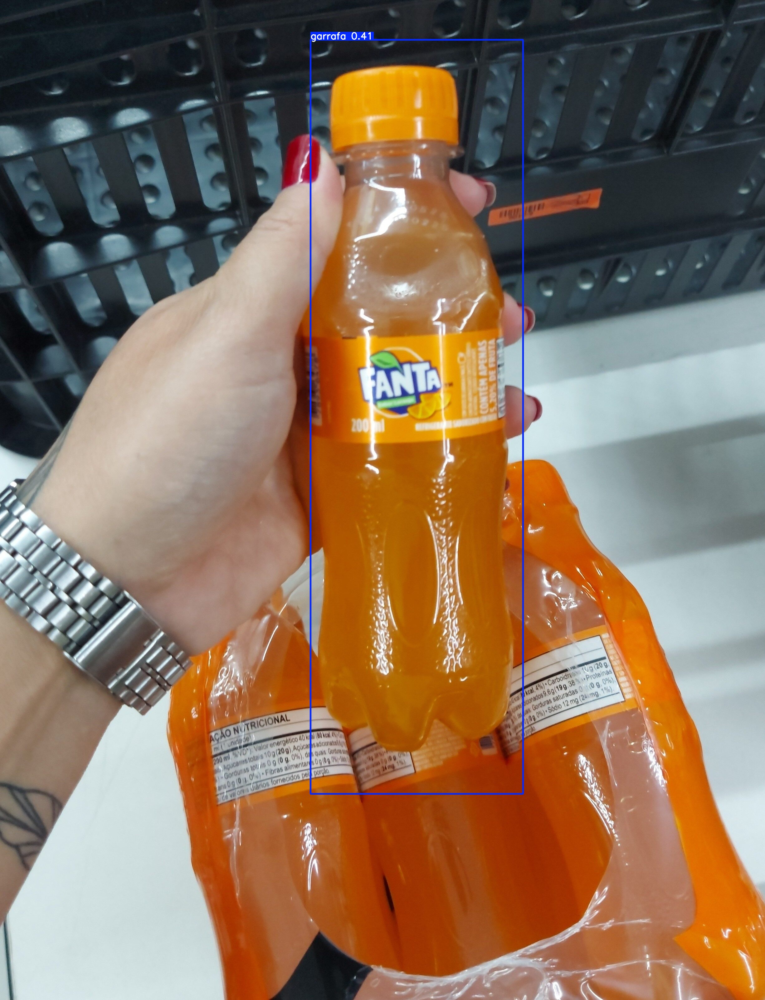

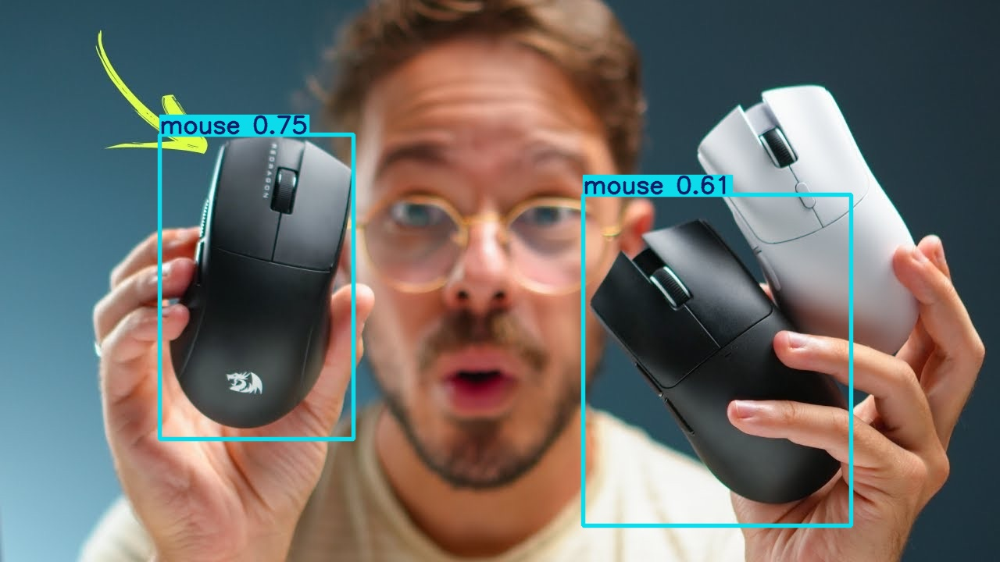

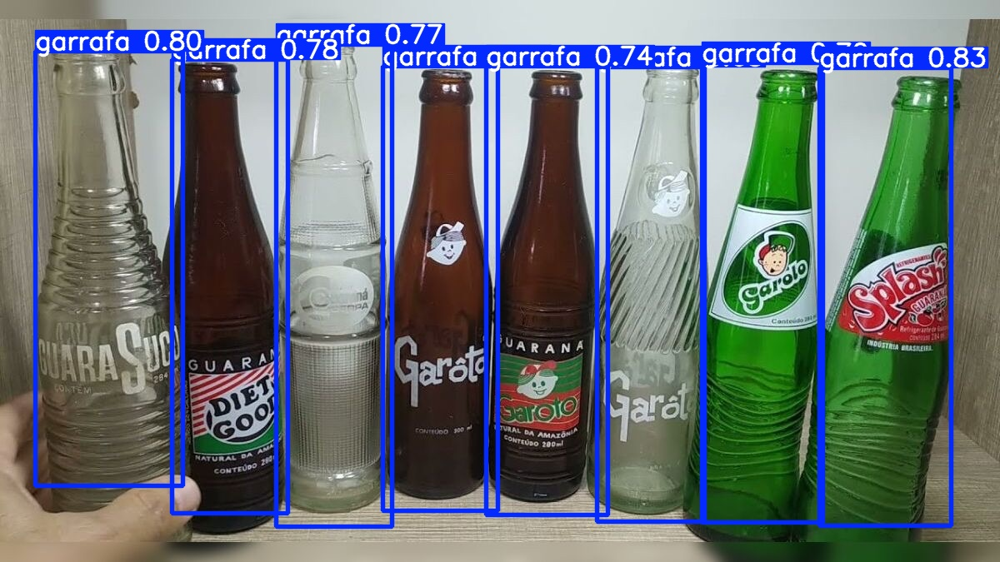

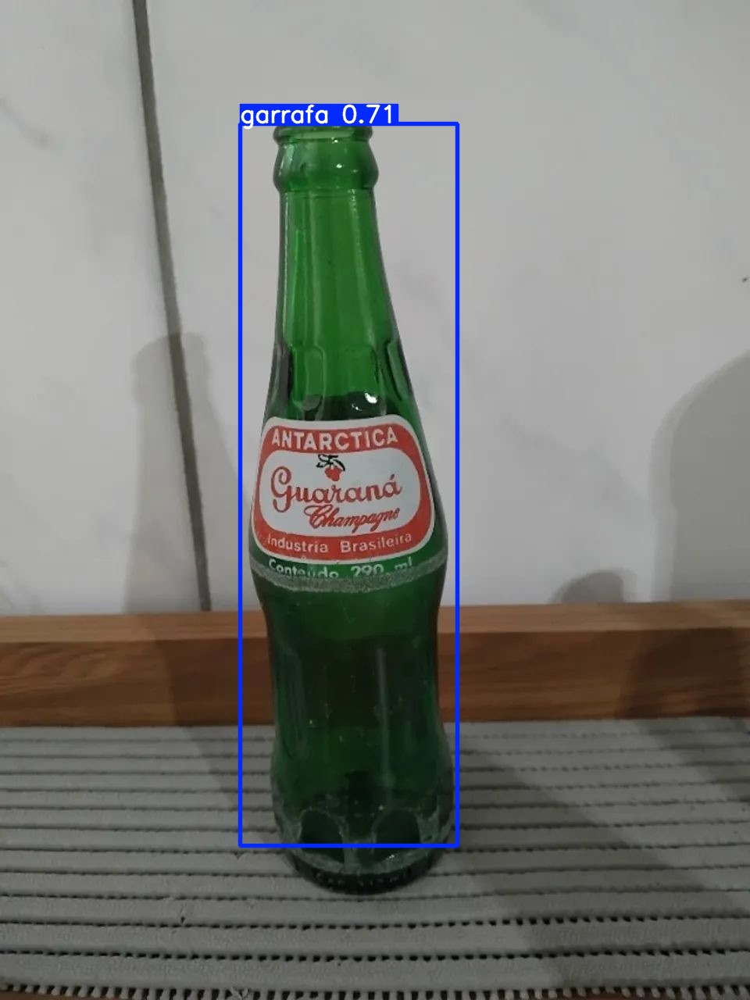

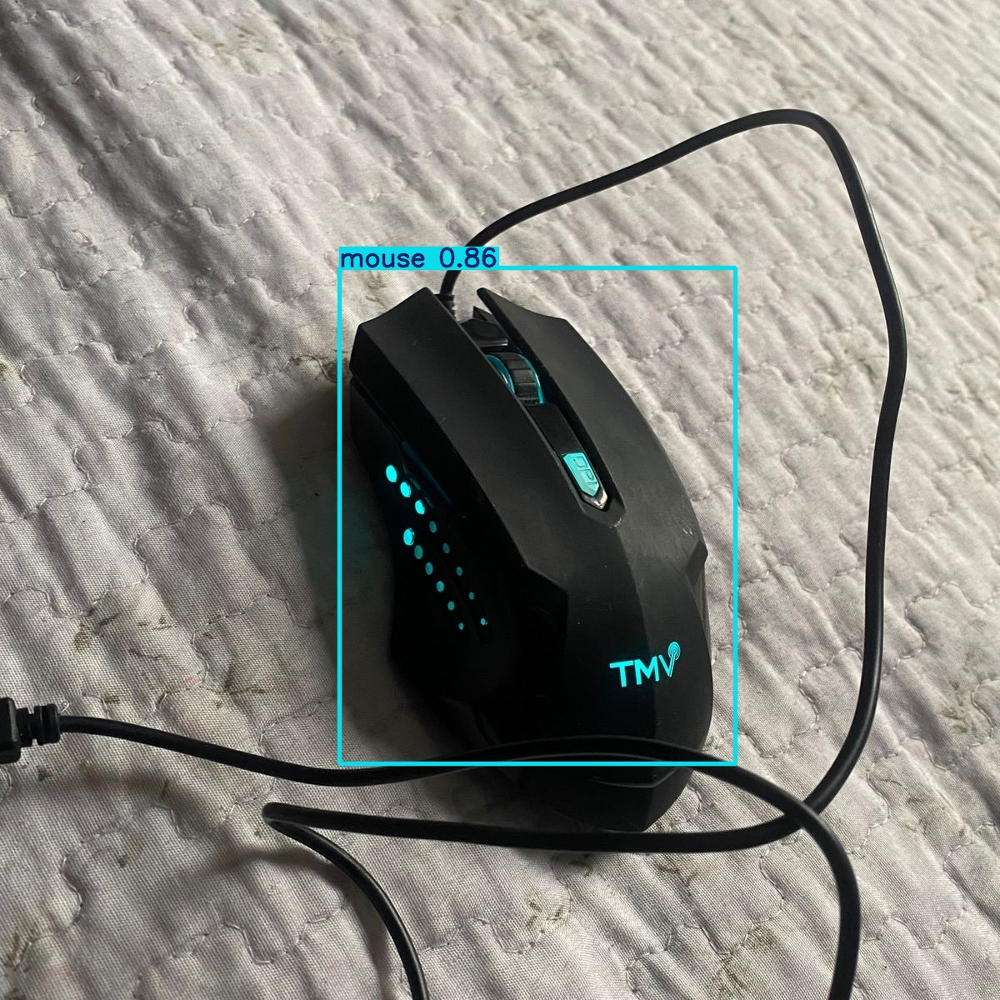

In [26]:
from IPython.display import Image, display
import os

results_path = 'runs/detect/exp'

for img in os.listdir(results_path):
    display(Image(filename=os.path.join(results_path, img)))

## Conclusão final

A partir dos experimentos realizados, foi possível concluir que o aumento do número de épocas teve impacto direto na melhoria do desempenho do modelo.

O modelo treinado com 60 épocas apresentou:
- Maior precisão nas detecções
- Melhor capacidade de generalização
- Curvas mais estáveis e consistentes
- Melhor desempenho em métricas mais rigorosas (mAP@0.5:0.95)

Apesar disso, o treinamento com mais épocas também implica maior custo computacional, o que deve ser considerado em cenários reais.

De forma geral, o modelo demonstrou ser capaz de realizar a detecção dos objetos propostos (garrafa e mouse) com boa acurácia, validando o uso da arquitetura YOLO para aplicações de visão computacional.

Como trabalhos futuros, seria possível:
- Aumentar o tamanho do dataset
- Melhorar a diversidade das imagens
- Ajustar hiperparâmetros do modelo

Essas melhorias poderiam levar a resultados ainda mais robustos.

## YOLO padrão

Nesta etapa, foi utilizada a YOLOv5 padrão, com pesos pré-treinados, sem treinamento adicional com o dataset customizado.

O objetivo é comparar o desempenho de um modelo genérico com o modelo YOLO customizado treinado especificamente para as classes garrafa e mouse.

In [4]:
%cd /content/yolov5

!python detect.py \
--weights yolov5s.pt \
--img 640 \
--conf 0.25 \
--source /content/drive/MyDrive/FIAP/Fase6/dataset/images/test \
--name yolo_padrao

/content/yolov5
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
detect: weights=['yolov5s.pt'], source=/content/drive/MyDrive/FIAP/Fase6/dataset/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=yolo_padrao, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-481-g00c14a25 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

100% 14.1M/14.1M [00:00<00:00, 389MB/s]

Fusing layers

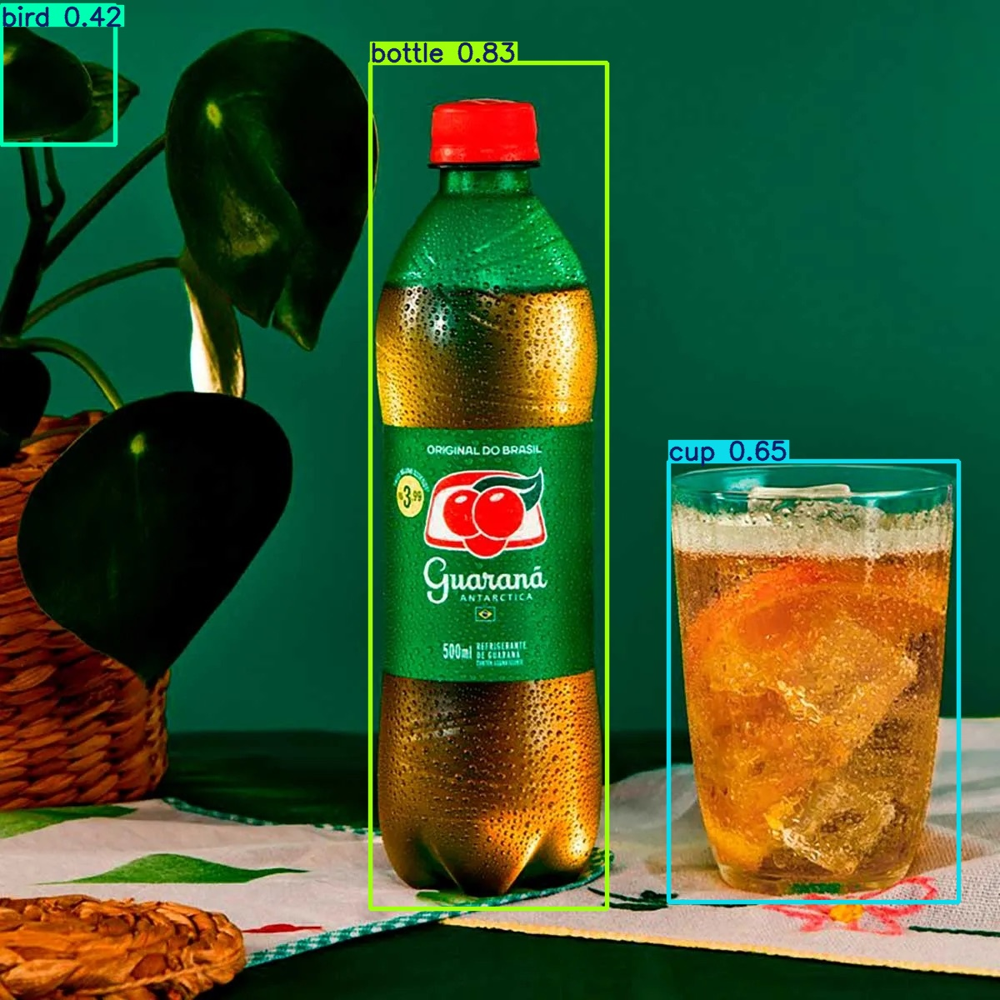

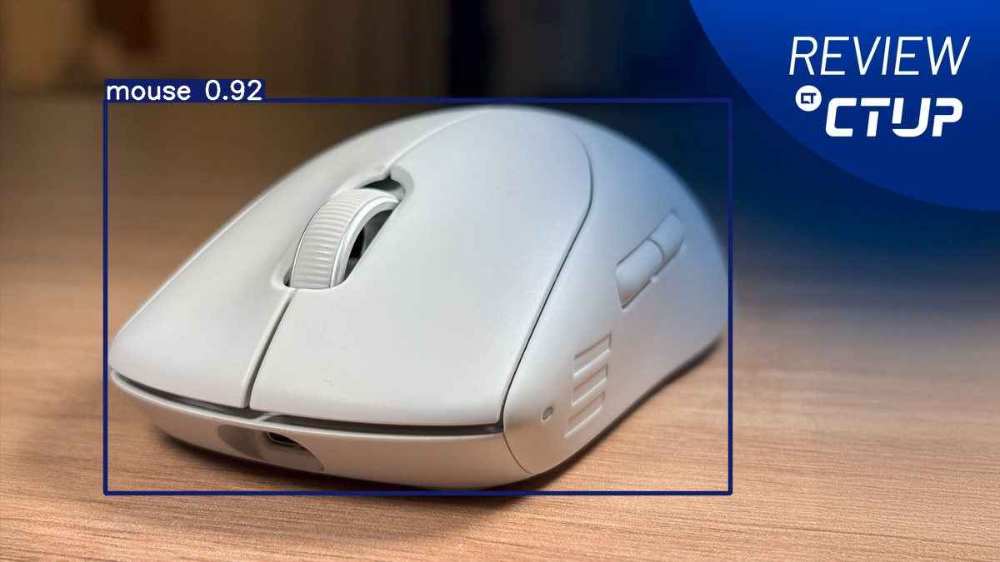

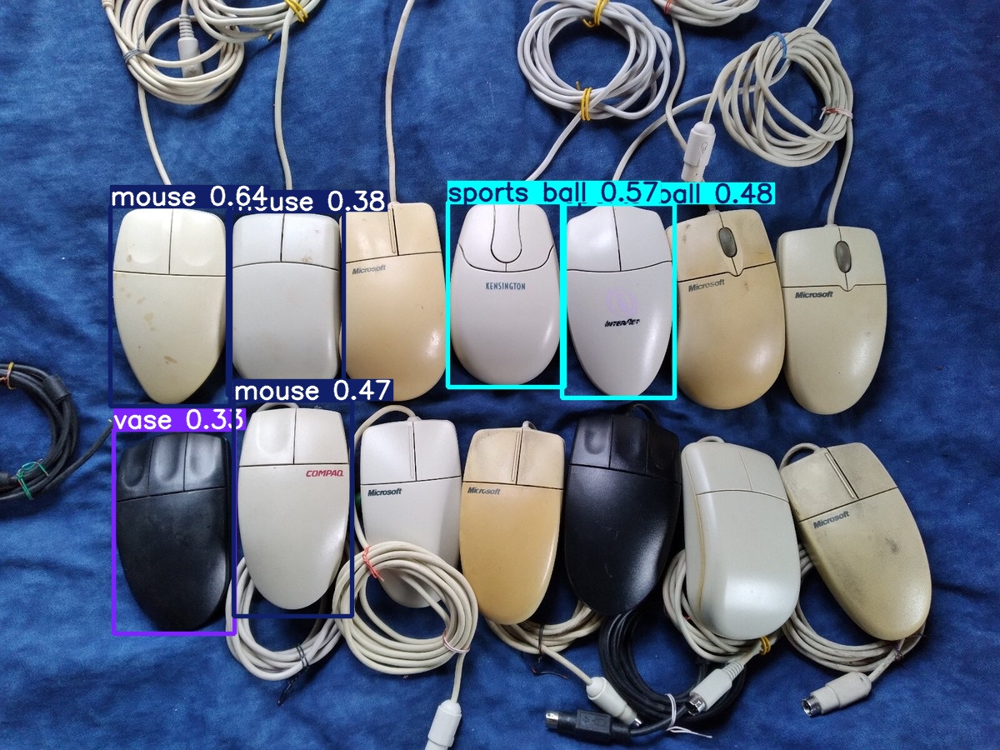

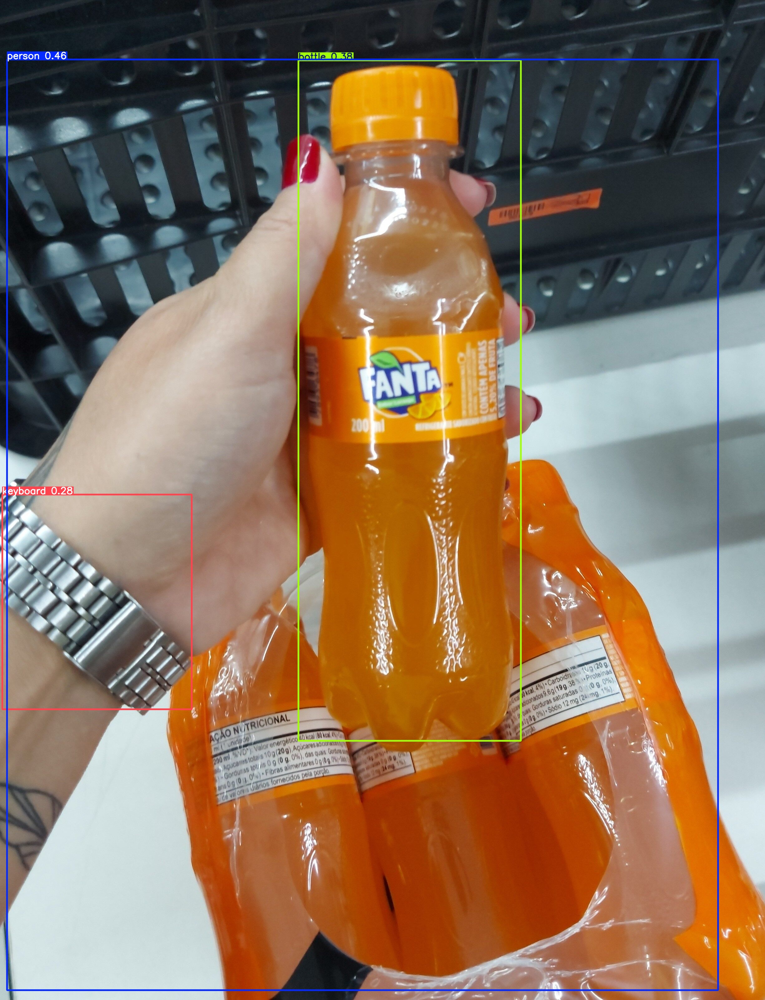

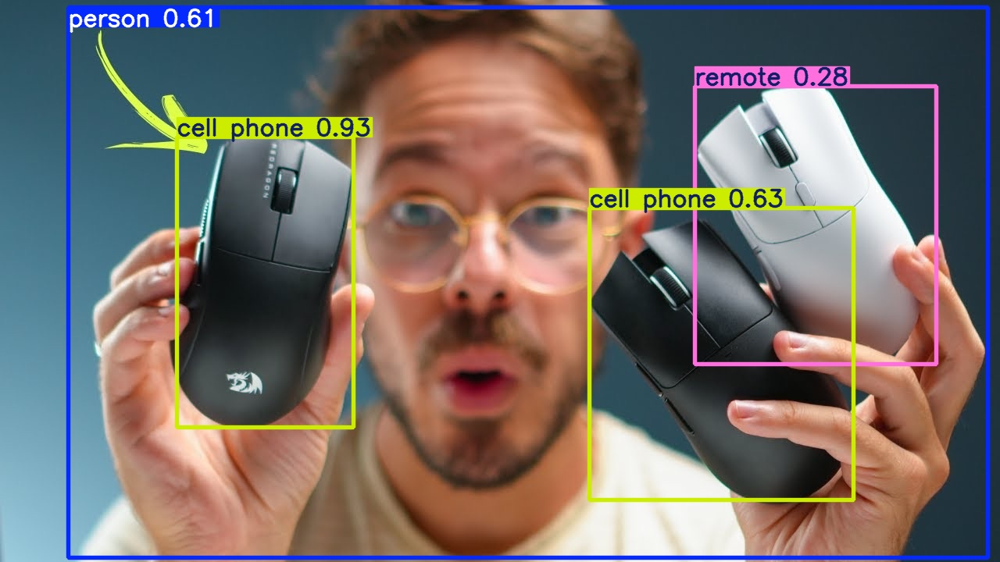

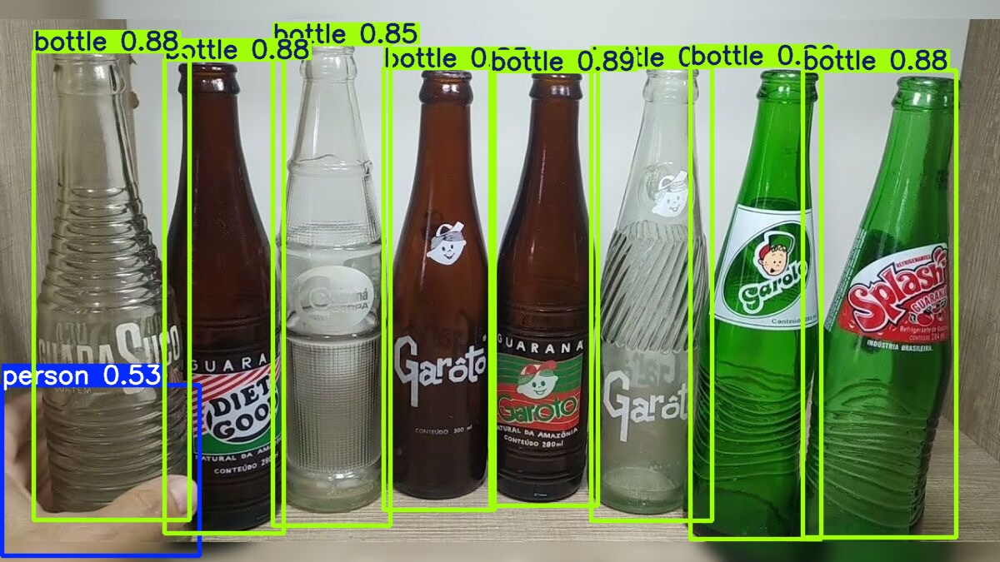

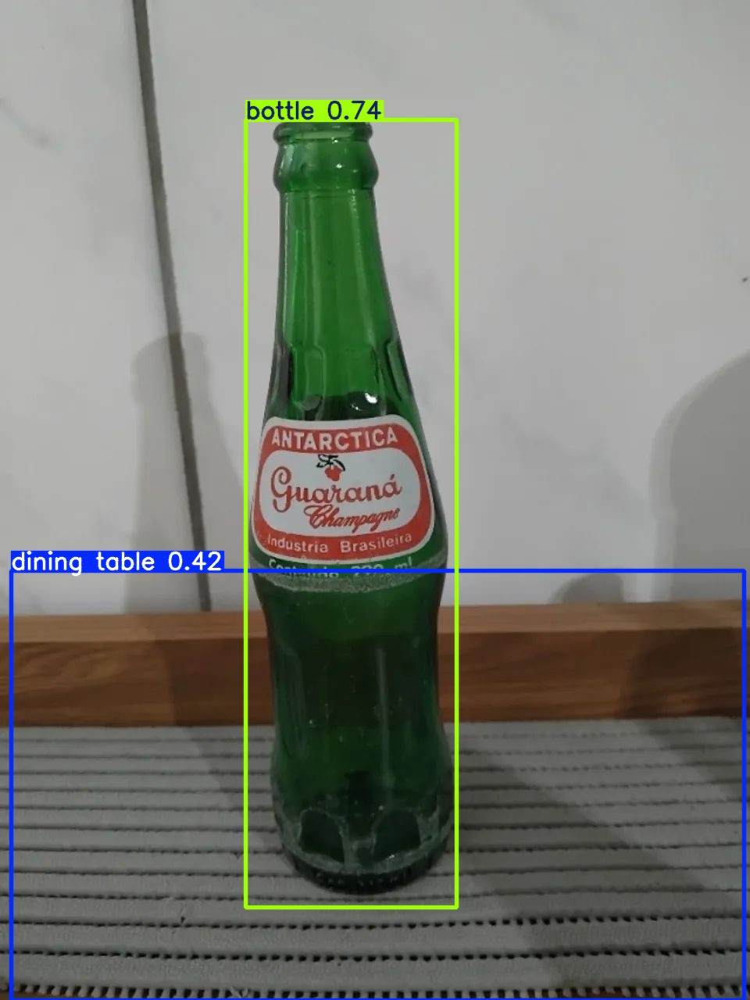

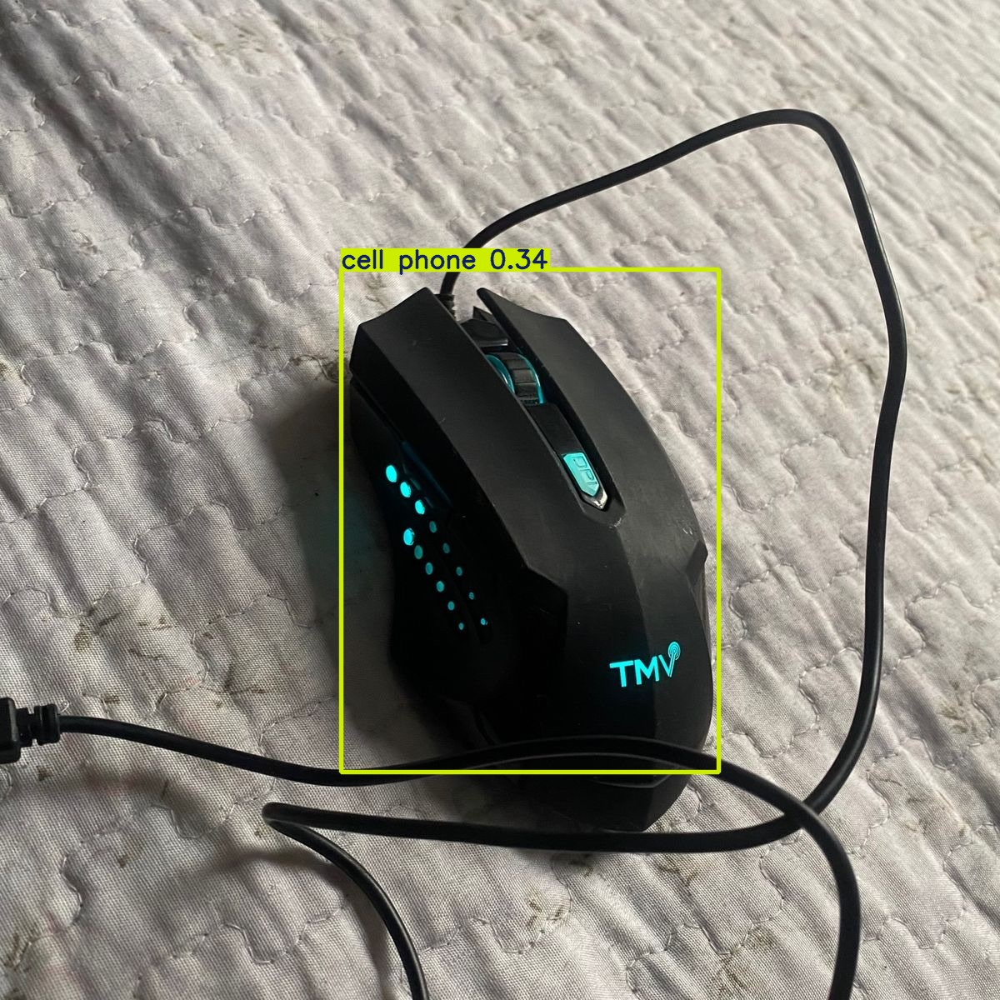

In [5]:
from IPython.display import Image, display
import os

results_path = "runs/detect/yolo_padrao"

for img in os.listdir(results_path):
    display(Image(filename=os.path.join(results_path, img)))

## Análise — YOLO padrão

A aplicação da YOLO padrão (pré-treinada no dataset COCO) apresentou resultados mistos ao ser utilizada no conjunto de imagens deste projeto.

De forma geral, o modelo demonstrou boa capacidade de detecção de objetos comuns, como garrafas, porém apresentou diversas inconsistências ao lidar com objetos específicos do contexto do dataset.

### Pontos positivos
A YOLO padrão conseguiu detectar corretamente garrafas com boa precisão em diferentes cenários;
O modelo apresentou alta confiança em objetos conhecidos, como "bottle" e "cup";
A inferência foi rápida e eficiente, sem necessidade de treinamento adicional.

### Limitações observadas
O modelo não reconhece a classe "mouse" corretamente, pois essa classe não faz parte do dataset COCO;
Foram observadas diversas classificações incorretas, como:
Mouse sendo identificado como cell phone;
Mouse sendo identificado como sports ball;
Objetos irrelevantes sendo detectados (person, keyboard, dining table);
Houve ocorrência de falsos positivos, com detecção de objetos inexistentes ou irrelevantes para o contexto do projeto;
O modelo apresentou baixa especialização, pois não foi treinado com os dados específicos do problema.


### Conclusão da etapa

A YOLO padrão, embora poderosa e eficiente, mostrou-se limitada para aplicações específicas, como a detecção das classes "garrafa" e "mouse".

Isso evidencia a importância do treinamento customizado, permitindo que o modelo aprenda características específicas do domínio e alcance maior precisão.

## CNN treinada do zero

Nesta etapa, foi criada uma rede neural convolucional simples para classificar as imagens entre as classes garrafa e mouse.

Diferentemente da YOLO, a CNN não realiza detecção com bounding boxes. Ela apenas classifica a imagem inteira em uma das classes disponíveis.

O objetivo é comparar uma abordagem de classificação com uma abordagem de detecção de objetos.

In [6]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt

base_dir = "/content/drive/MyDrive/FIAP/Fase6/dataset_classification"

IMG_SIZE = (224, 224)
BATCH_SIZE = 16

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    f"{base_dir}/train",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    f"{base_dir}/val",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
print("Classes:", class_names)

model = models.Sequential([
    layers.Rescaling(1./255),

    layers.Conv2D(32, (3, 3), activation="relu"),
    layers.MaxPooling2D(),

    layers.Conv2D(64, (3, 3), activation="relu"),
    layers.MaxPooling2D(),

    layers.Conv2D(128, (3, 3), activation="relu"),
    layers.MaxPooling2D(),

    layers.Flatten(),
    layers.Dense(128, activation="relu"),
    layers.Dense(len(class_names), activation="softmax")
])

model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10
)

Found 64 files belonging to 2 classes.
Found 8 files belonging to 2 classes.
Classes: ['garrafa', 'mouse']
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 479ms/step - accuracy: 0.5000 - loss: 2.3663 - val_accuracy: 0.5000 - val_loss: 0.7125
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - accuracy: 0.5312 - loss: 0.6828 - val_accuracy: 0.5000 - val_loss: 0.7820
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 271ms/step - accuracy: 0.7500 - loss: 0.6165 - val_accuracy: 0.5000 - val_loss: 0.7272
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 259ms/step - accuracy: 0.7656 - loss: 0.5115 - val_accuracy: 0.3750 - val_loss: 0.7497
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step - accuracy: 0.9062 - loss: 0.3254 - val_accuracy: 0.5000 - val_loss: 0.9648
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 255ms/step - accuracy: 0.8906 - loss: 0.3230 - val_accuracy: 0.2500 - val_loss: 1.2005
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 261ms/step - accuracy: 0.8906 - loss: 0.2284 - val_accuracy: 0.3750 - val_loss: 1.3117
Epoch 8/10


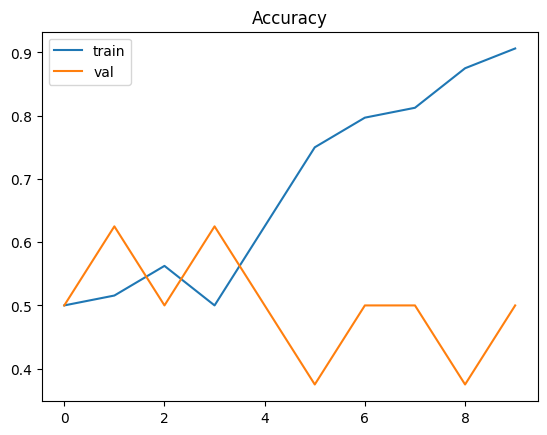

In [4]:
plt.plot(history.history["accuracy"], label="Treino")
plt.plot(history.history["val_accuracy"], label="Validação")
plt.title("Acurácia - CNN")
plt.xlabel("Épocas")
plt.ylabel("Acurácia")
plt.legend()
plt.show()

## Análise do modelo CNN

Observa-se que o modelo apresentou um aumento consistente na acurácia de treino, atingindo valores próximos de 90%.

No entanto, a acurácia de validação se manteve instável ao longo das épocas, variando entre aproximadamente 35% e 62%.

Essa diferença entre os desempenhos indica a ocorrência de overfitting, onde o modelo aprende bem os dados de treino, mas apresenta dificuldade em generalizar para novos dados.

Esse comportamento pode ser explicado pelo tamanho reduzido do dataset e pela baixa diversidade das imagens utilizadas no treinamento.

Como consequência, o modelo CNN se mostra menos robusto quando comparado ao YOLOv5, que apresentou melhor capacidade de generalização no mesmo conjunto de dados.

## Comparação Final dos Modelos

Nesta etapa, foi realizada uma análise comparativa entre três abordagens diferentes de visão computacional:

- YOLO customizada (treinada com dataset próprio)
- YOLO padrão (pré-treinada no COCO)
- CNN treinada do zero

A comparação foi feita considerando critérios fundamentais para aplicações reais.

---

### 🔧 Facilidade de uso / integração

- **YOLO padrão:** Muito fácil de usar. Basta carregar o modelo e aplicar diretamente, sem necessidade de treinamento.
- **YOLO customizada:** Exige preparação de dataset e treinamento, porém mantém uma boa facilidade de uso após treinada.
- **CNN do zero:** Requer maior esforço de implementação, definição da arquitetura e ajuste de hiperparâmetros.

👉 **Melhor nesse critério:** YOLO padrão

---

### 🎯 Precisão do modelo

- **YOLO customizada:** Apresentou melhor desempenho, com detecção correta de garrafas e mouse, além de boa localização (bounding boxes).
- **YOLO padrão:** Funcionou bem para objetos conhecidos (garrafa), mas falhou para mouse e gerou falsos positivos.
- **CNN do zero:** Conseguiu aprender padrões, mas apresentou instabilidade e menor capacidade de generalização.

👉 **Melhor nesse critério:** YOLO customizada

---

### ⏱️ Tempo de treinamento / customização

- **YOLO padrão:** Não necessita treinamento.
- **YOLO customizada:** Tempo moderado de treinamento (30–60 épocas).
- **CNN do zero:** Treinamento mais rápido, porém exige ajustes manuais frequentes.

👉 **Melhor nesse critério:** YOLO padrão

---

### ⚡ Tempo de inferência (predição)

- **YOLO (padrão e customizada):** Muito rápido, ideal para aplicações em tempo real.
- **CNN do zero:** Também rápida, mas limitada por não realizar detecção de objetos.

👉 **Melhor nesse critério:** YOLO (empate entre padrão e customizada)

---

### 🧠 Capacidade de generalização

- **YOLO padrão:** Alta generalização, pois foi treinada em um grande dataset (COCO).
- **YOLO customizada:** Boa generalização dentro do domínio específico.
- **CNN do zero:** Baixa generalização devido ao dataset pequeno.

👉 **Melhor nesse critério:** YOLO padrão

---

## 🏁 Conclusão Final

A análise demonstra que:

- A **YOLO customizada** é a melhor opção para problemas específicos, pois apresenta maior precisão e capacidade de adaptação ao domínio.
- A **YOLO padrão** é ideal para aplicações rápidas e genéricas, mas limitada quando o objeto não está no dataset original.
- A **CNN treinada do zero** é útil para aprendizado e cenários simples, porém menos eficiente para tarefas de detecção.

👉 Portanto, para aplicações reais de visão computacional com múltiplos objetos, a abordagem mais indicada é a **YOLO customizada**, que equilibra precisão, desempenho e flexibilidade.